# 1. Загрузить данные

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as sts
import seaborn as sns
import statistics
%matplotlib inline

[Датасет](https://www.kaggle.com/toramky/automobile-dataset)

In [4]:
df = pd.read_csv("auto.csv")

In [5]:
df.head()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,164,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,164,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,164,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


# 2. Рассчитать статистические показатели

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   normalized-losses  205 non-null    int64  
 2   make               205 non-null    object 
 3   fuel-type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num-of-doors       205 non-null    object 
 6   body-style         205 non-null    object 
 7   drive-wheels       205 non-null    object 
 8   engine-location    205 non-null    object 
 9   wheel-base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb-weight        205 non-null    int64  
 14  engine-type        205 non-null    object 
 15  num-of-cylinders   205 non-null    object 
 16  engine-size        205 non

In [7]:
#В наших данных нет пропущенных значений:
df.isnull().any()    

symboling            False
normalized-losses    False
make                 False
fuel-type            False
aspiration           False
num-of-doors         False
body-style           False
drive-wheels         False
engine-location      False
wheel-base           False
length               False
width                False
height               False
curb-weight          False
engine-type          False
num-of-cylinders     False
engine-size          False
fuel-system          False
bore                 False
stroke               False
compression-ratio    False
horsepower           False
peak-rpm             False
city-mpg             False
highway-mpg          False
price                False
dtype: bool

In [8]:
df.describe()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834146,126.365854,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.324878,3.253366,10.142537,106.048780,5131.463415,25.219512,30.751220,13312.712195
std,1.245307,35.438400,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.273049,0.313937,3.972040,43.468803,480.933330,6.542142,6.886443,8102.472461
min,-2.000000,65.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,0.000000,101.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.130000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7775.000000
50%,1.000000,122.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,2.000000,150.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,120.000000,5500.000000,30.000000,34.000000,16503.000000
max,3.000000,256.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


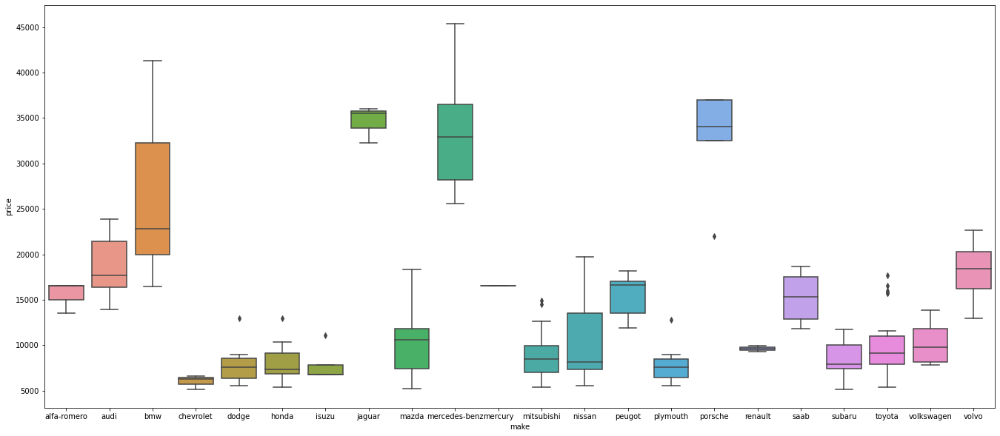

In [9]:
plt.rcParams['figure.figsize']=(23,10)
ax = sns.boxplot(x="make", y="price", data=df)

In [10]:
df.select_dtypes(include='object').mode()

,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,engine-type,num-of-cylinders,fuel-system
0,toyota,gas,std,four,sedan,fwd,front,ohc,four,mpfi


# 3. Рассчитать и визуализировать корреляционную матрицу для переменных

In [11]:
corr_matrix = df.corr()
corr_matrix

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
symboling,1.000000,0.497890,-0.531954,-0.357612,-0.232919,-0.541038,-0.227691,-0.105790,-0.160225,-0.020132,-0.178515,0.070421,0.273125,-0.035823,0.034606,-0.080149
normalized-losses,0.497890,1.000000,-0.029810,0.051375,0.122172,-0.332532,0.152171,0.166203,0.013503,0.038636,-0.148861,0.274619,0.234561,-0.290161,-0.256047,0.199860
wheel-base,-0.531954,-0.029810,1.000000,0.874587,0.795144,0.589435,0.776386,0.569329,0.495108,0.164549,0.249786,0.301696,-0.363355,-0.470414,-0.544082,0.571784
length,-0.357612,0.051375,0.874587,1.000000,0.841118,0.491029,0.877728,0.683360,0.608905,0.132076,0.158414,0.521192,-0.279406,-0.670909,-0.704662,0.678818
width,-0.232919,0.122172,0.795144,0.841118,1.000000,0.279210,0.867032,0.735433,0.556374,0.183379,0.181129,0.596251,-0.214240,-0.642704,-0.677218,0.764977
height,-0.541038,-0.332532,0.589435,0.491029,0.279210,1.000000,0.295572,0.067149,0.199995,-0.044176,0.261214,-0.114968,-0.322525,-0.048640,-0.107358,0.112421
curb-weight,-0.227691,0.152171,0.776386,0.877728,0.867032,0.295572,1.000000,0.850594,0.648219,0.170425,0.151362,0.679865,-0.264976,-0.757414,-0.797465,0.835657
engine-size,-0.105790,0.166203,0.569329,0.683360,0.735433,0.067149,0.850594,1.000000,0.602516,0.211477,0.028971,0.742119,-0.241031,-0.653658,-0.677470,0.870751
bore,-0.160225,0.013503,0.495108,0.608905,0.556374,0.199995,0.648219,0.602516,1.000000,-0.049492,0.008511,0.537543,-0.276942,-0.556570,-0.562065,0.549438
stroke,-0.020132,0.038636,0.164549,0.132076,0.183379,-0.044176,0.170425,0.211477,-0.049492,1.000000,0.187134,0.164722,-0.051970,-0.033609,-0.036502,0.079775


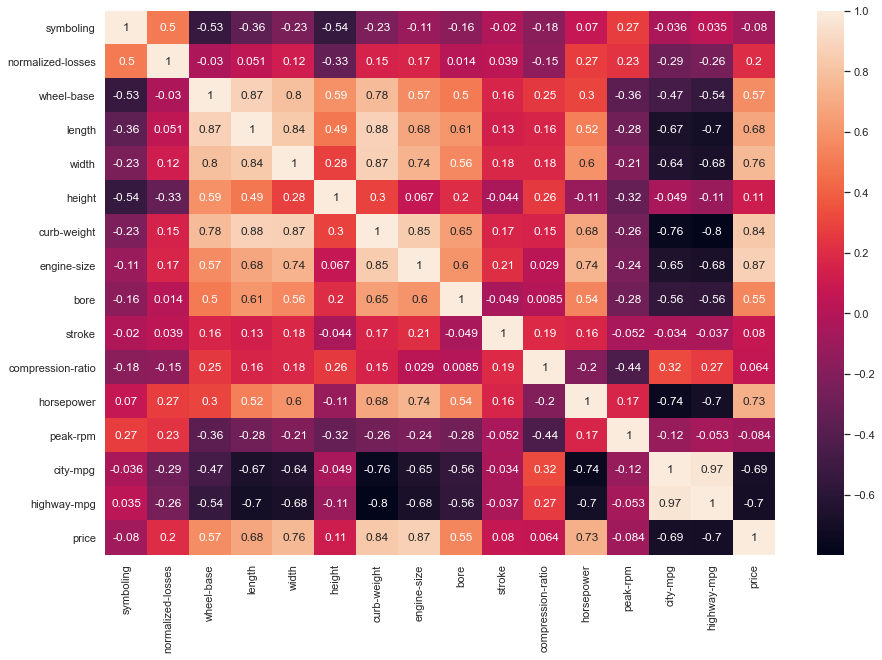

In [12]:
sns.set(rc=({'figure.figsize':(15, 10)}))
sns.heatmap(corr_matrix, annot=True, xticklabels=corr_matrix.columns.values, yticklabels=corr_matrix.columns.values)

### Можно для всего вышеописанного испльзовать Pandas profiling 

In [11]:
! pip install pandas_profiling

In [12]:
import pandas_profiling

In [13]:
df.profile_report()

# 4. Визуализировать распределение переменной Price и рассчитать показатели Skewness и Kurtosis.

[Ассиметрия (skewness) и эксцесс (kurtosis)](https://studfile.net/preview/3126503/)

[Как правильно использовать функции scipy skew и kurtosis?](https://fooobar.com/questions/725094/how-to-correctly-use-scipys-skew-and-kurtosis-functions)

[Критерий ассиметрии и эксцесса](http://www.machinelearning.ru/wiki/index.php?title=%D0%9A%D1%80%D0%B8%D1%82%D0%B5%D1%80%D0%B8%D0%B9_%D0%B0%D1%81%D0%B8%D0%BC%D0%BC%D0%B5%D1%82%D1%80%D0%B8%D0%B8_%D0%B8_%D1%8D%D0%BA%D1%81%D1%86%D0%B5%D1%81%D1%81%D0%B0)

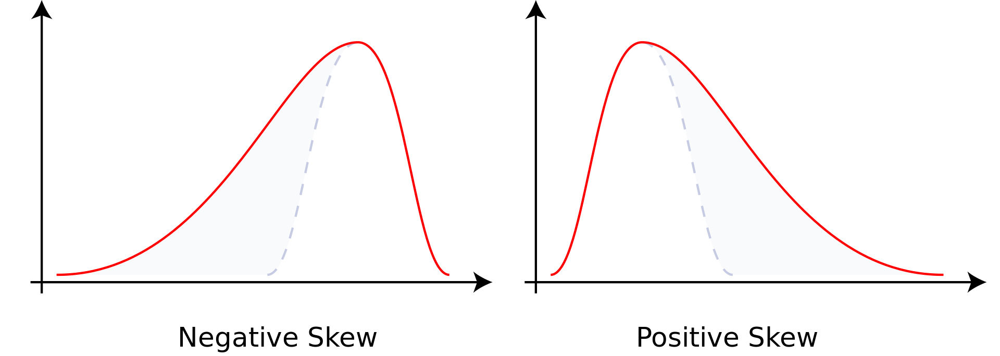

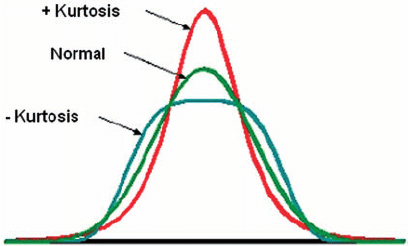

In [13]:
from scipy.stats import skew, kurtosis

In [14]:
skew(df["price"])

1.7534486514523662

In [15]:
kurtosis(df["price"])

2.848082544390688

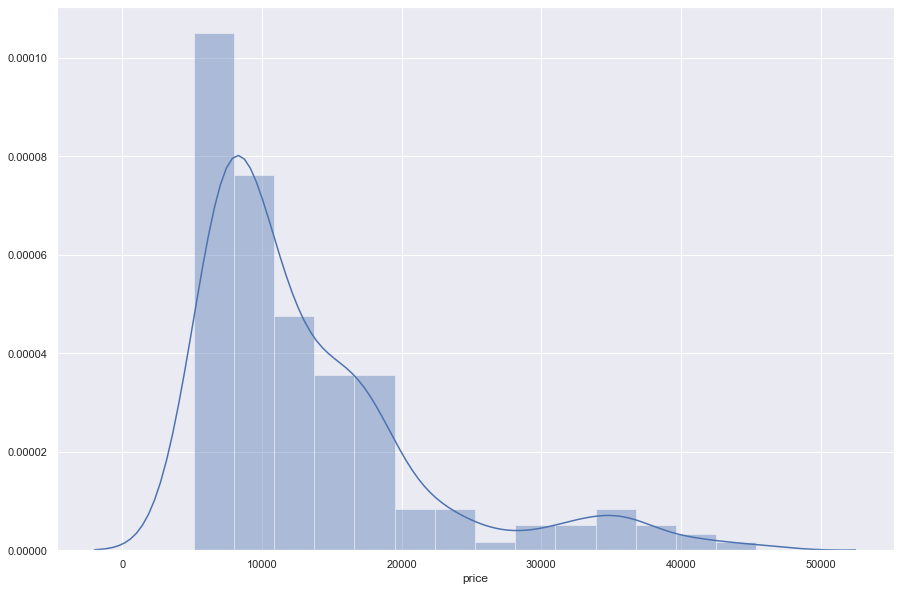

In [16]:
sns.distplot(df["price"])

# 5. Визуализировать неколько взаимосвязей между переменными

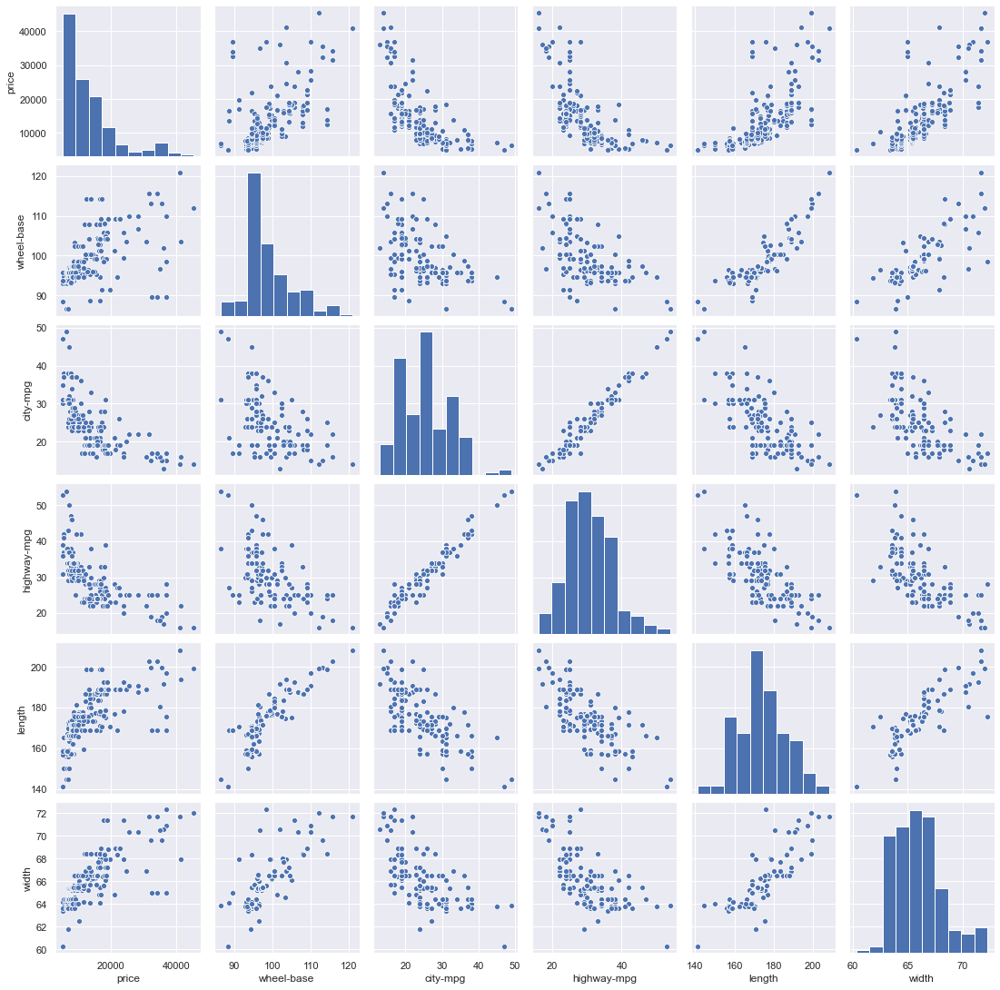

In [17]:
sns.pairplot(df, vars=['price', 'wheel-base', 'city-mpg', 'highway-mpg', 'length', 'width'], kind="scatter")

# 6. Выдвинуть несколько гипотез и проверить при помощи t test

Types of t-tests?
There are three main types of t-test:
1. An Independent Samples t-test compares the means for two groups.
2. A Paired sample t-test compares means from the same group at different times (say, one year apart).
3. A One sample t-test tests the mean of a single group against a known mean.



Assumptions

1. Observations in each sample are independent and identically distributed (iid).
2. Observations in each sample are normally distributed.
3. Observations in each sample have the same variance.


Interpretation

1. H0: the means of the samples are equal.
2. H1: the means of the samples are unequal.

Remark: The t-test assumes that the means of the different samples are normally distributed; it does not assume that the population is normally distributed.

By the central limit theorem, means of samples from a population with finite variance approach a normal distribution regardless of the distribution of the population. Rules of thumb say that the sample means are basically normally distributed as long as the sample size is at least 20 or 30. For a t-test to be valid on a sample of smaller size, the population distribution would have to be approximately normal.

The t-test is invalid for small samples from non-normal distributions, but it is valid for large samples from non-normal distributions.

In [18]:
#T- тест Стьюдента предполагает, что две выборки имеют нормальное распределение с равными дисперсиями.

#Т- тест Уэлча рассчитан на неравные дисперсии, но предположение о нормальности сохраняется. 

## Двигатели на бензине по трассе расходуют столько же сколько и на дизеле 

In [38]:
gas_hw=df[df["fuel-type"]=="gas"]["highway-mpg"]
disel_hw=df[df['fuel-type']=="diesel"]["highway-mpg"]

In [39]:
len(gas_hw), len(disel_hw)

(185, 20)

In [40]:
# Этот код нужно использовать только для классического т теста, если испльзуется Т-тест Уэлча то не надо этого делать
gas_hw = gas_hw.sample(20)
disel_hw = disel_hw.sample(20)

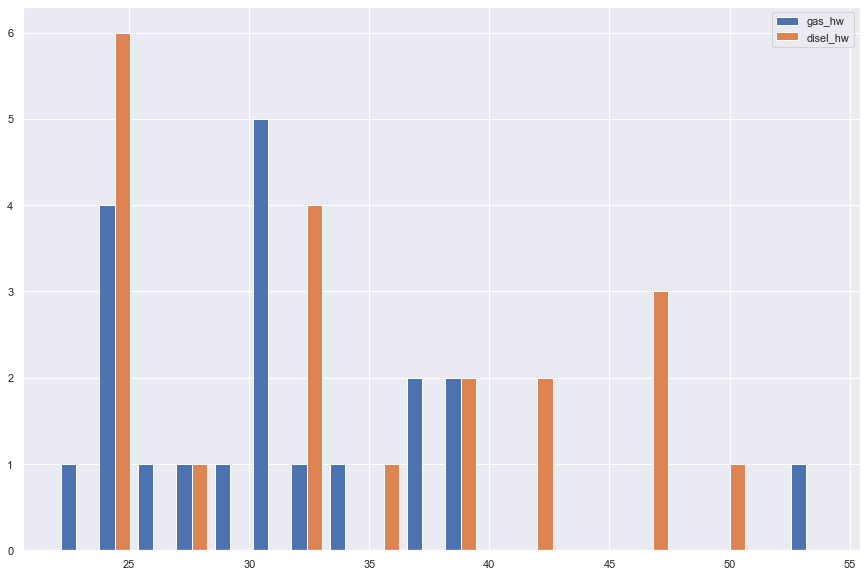

In [41]:
plt.hist([gas_hw, disel_hw], bins = 20, label=['gas_hw', 'disel_hw'])
plt.legend(loc='upper right')
plt.show()

In [42]:
sts.shapiro(gas_hw)

(0.8643962144851685, 0.009379374794661999)

In [43]:
sts.shapiro(disel_hw)

(0.891154944896698, 0.028240974992513657)

In [44]:
statistics.variance(gas_hw), statistics.variance(disel_hw)

(51.81842105263158, 74.40789473684211)

[Манн-уитни](https://ru.wikipedia.org/wiki/U-%D0%BA%D1%80%D0%B8%D1%82%D0%B5%D1%80%D0%B8%D0%B9_%D0%9C%D0%B0%D0%BD%D0%BD%D0%B0_%E2%80%94_%D0%A3%D0%B8%D1%82%D0%BD%D0%B8)

[Манн-Уитни пример](https://statpsy.ru/mana-uitni/primer-mana-uitni/)

In [45]:
sts.mannwhitneyu(gas_hw,disel_hw)

MannwhitneyuResult(statistic=151.0, pvalue=0.09329143632002213)

## Атмосферные двигатели по городу расходуют столько же сколько турбированные 

In [46]:
atmo_city=df[df["aspiration"]=="std"]["city-mpg"]
turbo_city=df[df["aspiration"]=="turbo"]["city-mpg"]

In [47]:
len(atmo_city), len(turbo_city)

(168, 37)

In [58]:
atmo_city = atmo_city.sample(35)
turbo_city = turbo_city.sample(35)

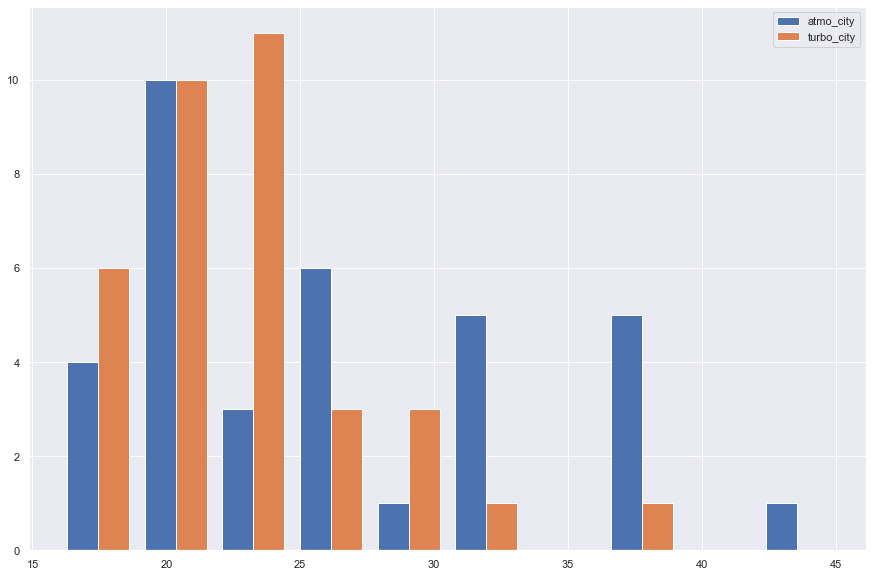

In [69]:
plt.hist([atmo_city, turbo_city], bins = 10, label=['atmo_city', 'turbo_city'])
plt.legend(loc='upper right')
plt.show()

In [70]:
sts.shapiro(atmo_city)

(0.9220886826515198, 0.016382988542318344)

In [71]:
sts.shapiro(turbo_city)

(0.8913447260856628, 0.0023329253308475018)

In [36]:
statistics.variance(atmo_city), statistics.variance(turbo_city)

(35.48235294117647, 23.129411764705882)

In [37]:
sts.ttest_ind(atmo_city, turbo_city, equal_var=False)

Ttest_indResult(statistic=2.3182639305190347, pvalue=0.02358642634452465)

# Машины стоимостью больше 15 000 имеют большую длинну

In [72]:
econom_lenght=df[df["price"]<15000]["length"]
buisness_lenght=df[df["price"]>=15000]["length"]

In [73]:
len(econom_lenght), len(buisness_lenght)

(141, 64)

In [76]:
econom_lenght = econom_lenght.sample(64)
buisness_lenght = buisness_lenght.sample(64)

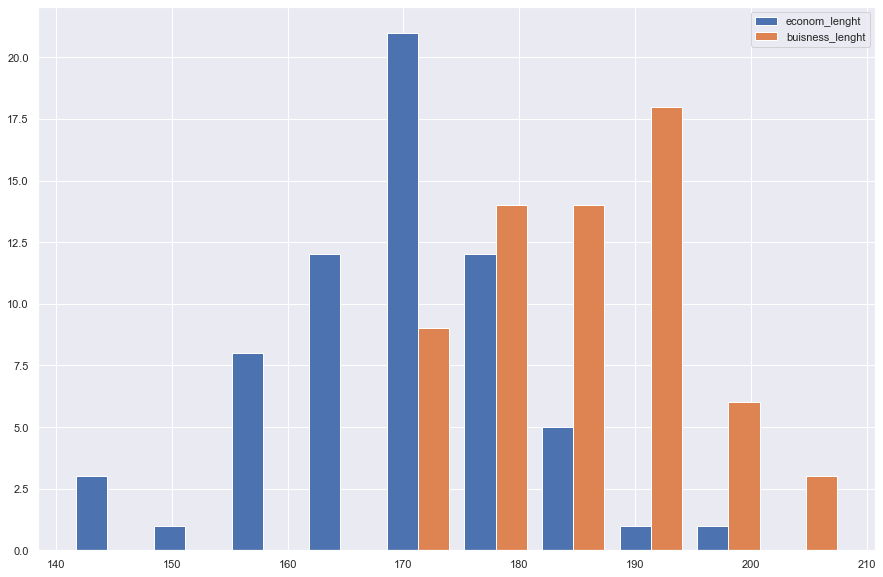

In [77]:
plt.hist([econom_lenght, buisness_lenght], bins = 10, label=['econom_lenght', 'buisness_lenght'])
plt.legend(loc='upper right')
plt.show()

In [78]:
sts.shapiro(econom_lenght)

(0.9615272283554077, 0.043787337839603424)

In [79]:
sts.shapiro(buisness_lenght)

(0.9537932872772217, 0.01766171306371689)

In [80]:
statistics.variance(econom_lenght), statistics.variance(buisness_lenght)

(110.96192212301584, 94.69521577380951)

In [81]:
sts.ttest_ind(econom_lenght, buisness_lenght, equal_var=False)

Ttest_indResult(statistic=-8.603105960356578, pvalue=2.7165410846855913e-14)